# Stiffness Coefficient Prediction for 1D Linear Elastic Problems

The solution of mechanical problems is one of the difficult and time-taking processes. Thus, the application of ML models is developed for these problems. 

In this notebook, the code related to the prediction of stiffness coefficients, used for the matrices during node findings, is developed. 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV, cross_val_score, cross_val_predict

from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor

from sklearn import metrics


In [2]:
# uploading the dataset
df = pd.read_excel(r'Dataset.xlsx')
print(f'The shape of the dataset is: {df.shape}')

The shape of the dataset is: (717, 4)


In [3]:
#checking the first elements of the dataset.
df.head()

,Ai,Ei,hi,K
0,0.007854,72000000000,0.3,1.884956e+09
1,0.001963,72000000000,0.2,7.068581e+08
2,0.001255,200000000000,0.1,2.509360e+09
3,0.001814,72000000000,0.1,1.305752e+09
4,0.005646,72000000000,0.2,2.032740e+09


In the defined dataset, the meanings of columns are defined as follows: 

Ai - area of the patterns (in our case it is circle);

Ei - Young's module;

hi - difference between the nodes;

K - stiffness coefficient.

In [4]:
#checking the info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 717 entries, 0 to 716
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Ai      717 non-null    float64
 1   Ei      717 non-null    int64  
 2   hi      717 non-null    float64
 3   K       717 non-null    float64
dtypes: float64(3), int64(1)
memory usage: 22.5 KB


In [5]:
# checking the description
df.describe()

,Ai,Ei,hi,K
count,717.000000,7.170000e+02,717.000000,7.170000e+02
mean,0.017722,9.033473e+10,0.335007,6.986732e+09
std,0.045464,4.647399e+10,0.210384,1.491476e+10
min,0.000057,7.000000e+10,0.100000,2.827392e+07
25%,0.010936,7.000000e+10,0.200000,1.563815e+09
50%,0.014527,7.000000e+10,0.300000,3.389569e+09
75%,0.020106,7.200000e+10,0.500000,7.918384e+09
max,0.636173,2.000000e+11,0.900000,1.971340e+11


## Data Cleaning


In [6]:
#checking the null values
df.isnull().mean()*100

Ai    0.0
Ei    0.0
hi    0.0
K     0.0
dtype: float64

In [7]:
df.duplicated().mean()*100

62.90097629009763

## Data Visualization 

In this part, the data are visualized via various charts, namely histograms, distributions, pairplots and heatmap

C:\Users\Zaur\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


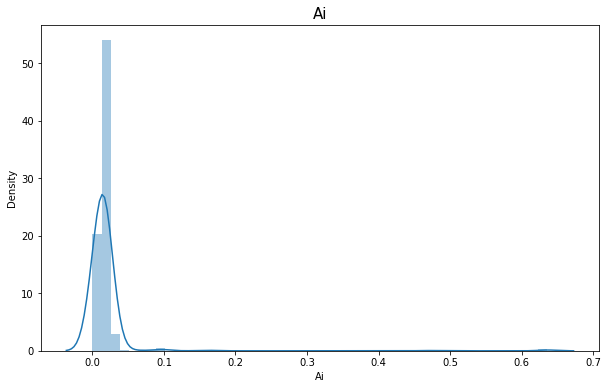

C:\Users\Zaur\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


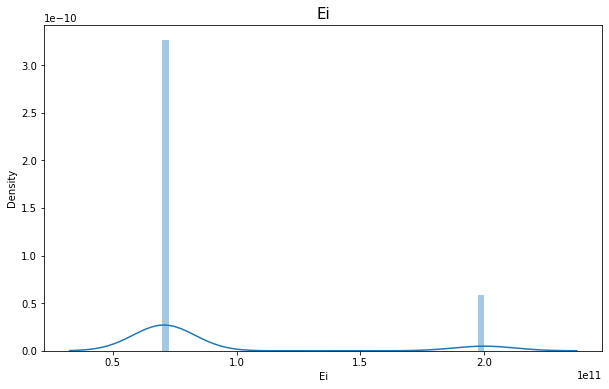

C:\Users\Zaur\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


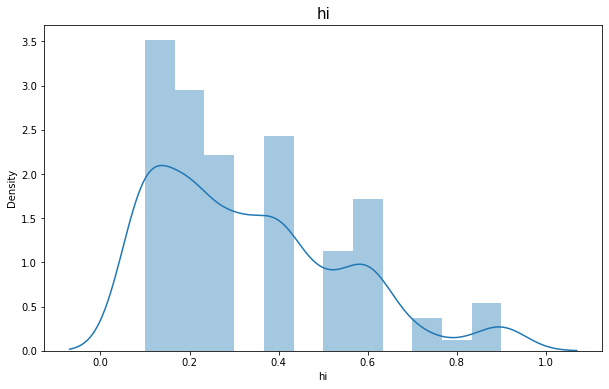

C:\Users\Zaur\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


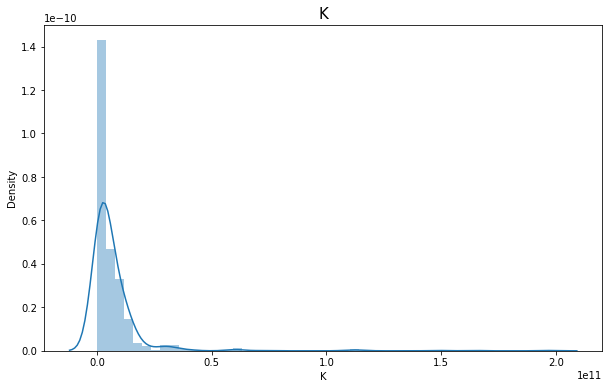

In [8]:
for i in df.columns:
    plt.figure(figsize=(10,6))
    sns.distplot(df[i])
    plt.title(i, size=15)
    plt.show()

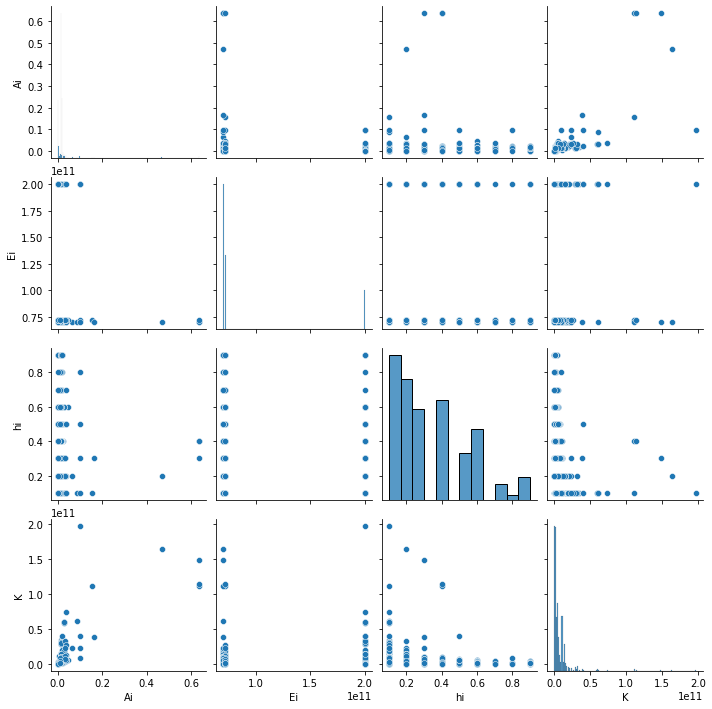

In [9]:
sns.pairplot(df)

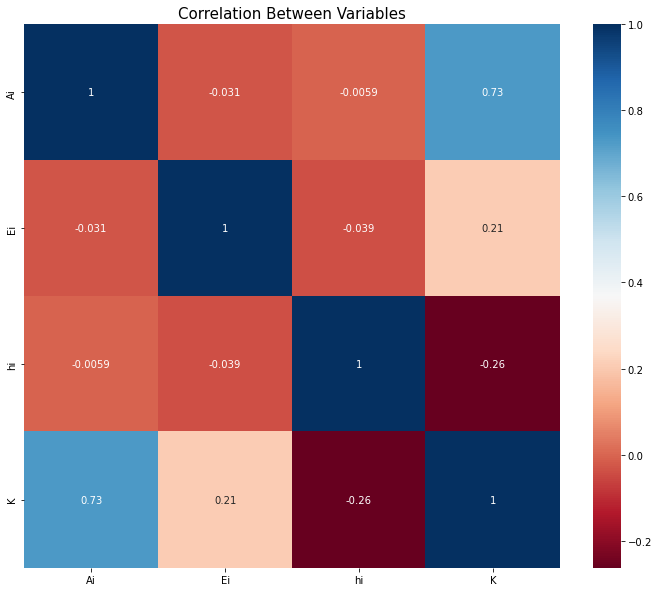

In [10]:
plt.figure(figsize=(12,10))
sns.heatmap(df.corr(),annot=True, cmap="RdBu")
plt.title("Correlation Between Variables", size=15)
plt.show()

## Data Preprocessing

In [11]:
# splitting into train and test sets: 


X_train, X_test, y_train, y_test = train_test_split(
    df.drop(['K'], axis=1), df['K'],
    test_size=0.3,
    random_state=0)

X_train.shape, X_test.shape

((501, 3), (216, 3))

## Machine Learning Models

In [12]:
def error_display(y_test, y_pred):
    print('MAE: {}'.format(metrics.mean_absolute_error(y_test, y_pred)))
    print('MSE: {}'.format(metrics.mean_squared_error(y_test, y_pred)))
    print('RMSE: {}'.format(np.sqrt(metrics.mean_squared_error(y_test, y_pred))))

### Linear Regression

In [13]:
# defining the Linear Regression algorithm
lr = LinearRegression()
lr.fit(X_train, y_train)
lr_pred = lr.predict(X_test)
lr_pred.reshape(-1,1)

array([[ 3.72906281e+09],
       [ 1.04060978e+10],
       [ 5.41533575e+09],
       [ 9.05896819e+09],
       [ 1.45419513e+10],
       [ 5.67009530e+09],
       [-5.01129149e+07],
       [-8.06502496e+08],
       [ 2.89711377e+09],
       [ 3.11883290e+09],
       [ 9.05896819e+09],
       [ 9.05896819e+09],
       [ 3.58351256e+09],
       [ 7.23715197e+09],
       [ 3.66919813e+09],
       [ 2.28177213e+09],
       [ 5.88130084e+09],
       [-1.58701846e+09],
       [ 7.23715197e+09],
       [ 7.23715197e+09],
       [ 6.76246535e+09],
       [ 7.23715197e+09],
       [ 4.24485385e+09],
       [ 1.60474651e+10],
       [ 9.51081386e+09],
       [ 1.12928064e+10],
       [ 9.19451147e+09],
       [ 2.15271428e+09],
       [ 5.41533575e+09],
       [ 1.60609125e+08],
       [ 8.54303644e+07],
       [ 4.15852174e+08],
       [-8.92017545e+09],
       [ 3.90982192e+09],
       [ 2.22354897e+09],
       [ 5.07619241e+09],
       [ 4.33937790e+09],
       [ 2.66189474e+08],
       [ 5.8

In [14]:
error_display(y_test, lr_pred)

MAE: 3096245219.0624237
MSE: 2.634544051026326e+19
RMSE: 5132780972.364129


### Random Forest Regressor

In [15]:
rf = RandomForestRegressor(n_estimators=100, random_state=39)
rf.fit(X_train, y_train)
rf_pred = rf.predict(X_test)
rf_pred.reshape(-1,1)

array([[2.61408406e+09],
       [1.40743351e+10],
       [3.38956903e+09],
       [1.01687071e+10],
       [1.04467799e+10],
       [3.34496316e+08],
       [1.69478452e+09],
       [6.91671897e+08],
       [2.69824540e+09],
       [2.81017557e+09],
       [1.01687071e+10],
       [1.01687071e+10],
       [1.63489269e+09],
       [5.08435355e+09],
       [6.95680676e+09],
       [4.28669101e+08],
       [6.11100112e+08],
       [9.09207398e+07],
       [5.08435355e+09],
       [5.08435355e+09],
       [4.69144503e+09],
       [5.08435355e+09],
       [5.31400227e+08],
       [1.45398249e+10],
       [1.14024734e+10],
       [1.68581682e+10],
       [1.04448378e+10],
       [1.03932278e+08],
       [3.38956903e+09],
       [1.53079478e+09],
       [1.73728637e+09],
       [1.43899254e+08],
       [4.92102831e+07],
       [2.77426023e+09],
       [2.27922773e+09],
       [3.51858377e+09],
       [6.00337605e+08],
       [1.84815089e+09],
       [3.62263856e+09],
       [5.22962079e+09],


In [16]:
error_display(rf_pred, y_test)

MAE: 739655583.2139993
MSE: 2.275602925025348e+19
RMSE: 4770328002.376092


In [17]:
# defining parameters for GridSearch

random_grid_params = {'n_estimators': [2,10,20, 30, 40],
                     'max_features': ['auto', 'sqrt'],
                     'max_depth': [int(x) for x in np.linspace(10, 1000, num = 11)],
                     'min_samples_split': [2, 5, 10, 15],
                     'min_samples_leaf' : [1, 2, 4],
                     'bootstrap': [True, False]}

rf_random = RandomizedSearchCV(estimator = rf, 
                              param_distributions = random_grid_params,
                              n_iter = 100, 
                               cv = 10,
                               verbose = 2, 
                               random_state = 42,
                               n_jobs = -1)
rf_random.fit(X_train, y_train)

Fitting 10 folds for each of 100 candidates, totalling 1000 fits


RandomizedSearchCV(cv=10, estimator=RandomForestRegressor(random_state=39),
                   n_iter=100, n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 109, 208, 307, 406,
                                                      505, 604, 703, 802, 901,
                                                      1000],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10, 15],
                                        'n_estimators': [2, 10, 20, 30, 40]},
                   random_state=42, verbose=2)

In [18]:
# best parameters
rf_random.best_params_

{'n_estimators': 40,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 1000,
 'bootstrap': True}

In [19]:
# applying newly researched parameters
rf_hyper = RandomForestRegressor(n_estimators = 40,
                                 min_samples_split = 2,
                                 min_samples_leaf = 1,
                                 max_features = 'sqrt',
                                 max_depth = 1000,
                                 bootstrap = True)
rf_hyper.fit(X_train, y_train)
rf_hyper_pred = rf_hyper.predict(X_test)
rf_hyper_pred.reshape(-1,1)

array([[2.61481040e+09],
       [1.40743351e+10],
       [3.38956903e+09],
       [1.01687071e+10],
       [1.05578457e+10],
       [3.32739574e+08],
       [1.69478452e+09],
       [5.84704798e+08],
       [2.51018405e+09],
       [2.81486702e+09],
       [1.01687071e+10],
       [1.01687071e+10],
       [1.68103482e+09],
       [5.08435355e+09],
       [5.55124136e+09],
       [3.88996914e+08],
       [5.81313063e+08],
       [8.70660236e+07],
       [5.08435355e+09],
       [5.08435355e+09],
       [4.69144503e+09],
       [5.08435355e+09],
       [5.08377672e+08],
       [1.45267244e+10],
       [1.14024734e+10],
       [1.59363712e+10],
       [1.04430960e+10],
       [1.17804559e+08],
       [3.38956903e+09],
       [1.09196253e+09],
       [1.73547146e+09],
       [1.44088432e+08],
       [5.11746612e+07],
       [2.77143450e+09],
       [2.27891100e+09],
       [3.60261300e+09],
       [6.10326605e+08],
       [1.84762300e+09],
       [4.16404597e+09],
       [5.22962079e+09],


In [20]:
error_display(y_test, rf_hyper_pred)

MAE: 722730078.0797658
MSE: 2.8019411495064637e+19
RMSE: 5293336518.214635


### Decision Tree Regressor

In [21]:
dtr =  DecisionTreeRegressor().fit(X_train, y_train)
dtr.fit(X_train, y_train)
dtr_pred = dtr.predict(X_test)
dtr_pred.reshape(-1,1)

array([[2.61481040e+09],
       [1.40743351e+10],
       [3.38956903e+09],
       [1.01687071e+10],
       [1.05578457e+10],
       [3.43611696e+08],
       [1.69478452e+09],
       [6.73478925e+08],
       [2.67588296e+09],
       [2.81486702e+09],
       [1.01687071e+10],
       [1.01687071e+10],
       [2.29022104e+09],
       [5.08435355e+09],
       [3.40234484e+09],
       [3.72000000e+08],
       [5.62973404e+08],
       [7.18377520e+07],
       [5.08435355e+09],
       [5.08435355e+09],
       [4.69144503e+09],
       [5.08435355e+09],
       [5.41800000e+08],
       [1.45267244e+10],
       [1.14024734e+10],
       [1.66451004e+10],
       [1.04421513e+10],
       [7.91681349e+07],
       [3.38956903e+09],
       [8.09640787e+08],
       [1.73628944e+09],
       [1.43960342e+08],
       [4.78918347e+07],
       [2.77143450e+09],
       [2.28049467e+09],
       [3.51858377e+09],
       [5.79069400e+08],
       [1.84762300e+09],
       [3.51858377e+09],
       [5.22962079e+09],


In [22]:
error_display(dtr_pred, y_test)

MAE: 1026709978.6367589
MSE: 9.370896761866854e+19
RMSE: 9680339230.557396


In [23]:
# Grid Searching

param_grid= {"criterion": ["squared_error", "friedman_mse", "absolute_error", "poisson"],
              "min_samples_split": [10, 20, 30, 40, 50,60],
              "max_depth": [2, 6, 8, 10, 12, 16, 20, 40],
              "min_samples_leaf": [10, 20, 30, 65],
              "max_leaf_nodes": [5, 20, 100],
              }

grid_cv_dtr = GridSearchCV(dtr, param_grid, cv=10)

grid_cv_dtr.fit(X_train,y_train)

C:\Users\Zaur\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Zaur\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Zaur\anaconda3\lib\site-packages\sklearn\tree\_classes.py", line 1247, in fit
    super().fit(
  File "C:\Users\Zaur\anaconda3\lib\site-packages\sklearn\tree\_classes.py", line 350, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'squared_error'

  warnings.warn("Estimator fit failed. The score on this train-test"
C:\Users\Zaur\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 


GridSearchCV(cv=10, estimator=DecisionTreeRegressor(),
             param_grid={'criterion': ['squared_error', 'friedman_mse',
                                       'absolute_error', 'poisson'],
                         'max_depth': [2, 6, 8, 10, 12, 16, 20, 40],
                         'max_leaf_nodes': [5, 20, 100],
                         'min_samples_leaf': [10, 20, 30, 65],
                         'min_samples_split': [10, 20, 30, 40, 50, 60]})

In [24]:
#best params 
grid_cv_dtr.best_params_

{'criterion': 'friedman_mse',
 'max_depth': 12,
 'max_leaf_nodes': 20,
 'min_samples_leaf': 20,
 'min_samples_split': 20}

In [25]:
# applying best params
dtr_grid = DecisionTreeRegressor(criterion = 'friedman_mse', 
                                 max_depth = 12, 
                                 max_leaf_nodes = 20,
                                 min_samples_leaf = 20, 
                                 min_samples_split = 30)
dtr_grid.fit(X_train, y_train)
dtr_grid_pred = dtr_grid.predict(X_test)
dtr_grid_pred.reshape(-1,1)

array([[2.43015022e+09],
       [1.68101447e+10],
       [3.56332604e+09],
       [1.06306761e+10],
       [8.78592935e+09],
       [9.72859615e+08],
       [1.54993308e+09],
       [1.25507375e+09],
       [2.62408167e+09],
       [3.31804449e+09],
       [1.06306761e+10],
       [1.06306761e+10],
       [1.25507375e+09],
       [5.28136206e+09],
       [5.31821103e+10],
       [2.28624132e+08],
       [9.72859615e+08],
       [2.28624132e+08],
       [5.28136206e+09],
       [5.28136206e+09],
       [6.71277335e+09],
       [5.28136206e+09],
       [2.44667570e+08],
       [8.59305710e+09],
       [1.68101447e+10],
       [1.68101447e+10],
       [1.06306761e+10],
       [1.06930124e+08],
       [3.56332604e+09],
       [1.25507375e+09],
       [1.54993308e+09],
       [2.44667570e+08],
       [1.06930124e+08],
       [2.62408167e+09],
       [2.62408167e+09],
       [3.31804449e+09],
       [2.44667570e+08],
       [1.54993308e+09],
       [3.31804449e+09],
       [5.28136206e+09],


### After ML

In [26]:
rf_hyper_df = pd.DataFrame(rf_hyper_pred)
rf_hyper_df.to_csv('RF.csv', index = False)

dtr_grid_pred_df = pd.DataFrame(dtr_grid_pred)
dtr_grid_pred_df.to_csv('DTR.csv', index = False)

In [27]:
df1 = pd.DataFrame(y_test)
df1.to_csv('Exact.csv', index=False)

In [28]:
df2 = pd.read_csv(r'RF.csv')
df3 = pd.read_csv(r'DTR.csv')

In [29]:
def plott(df, title1, title2):
    plt.plot(df[title1][:50], label = 'exact', color = 'red')
    plt.plot(df[title2][:50], label = 'predicted', color = 'blue')
    plt.legend()

Text(0.5, 1.0, 'Random Forest')

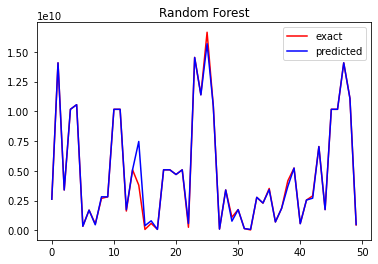

In [30]:
plott(df2, 'Exact', 'Predicted')
plt.title('Random Forest')

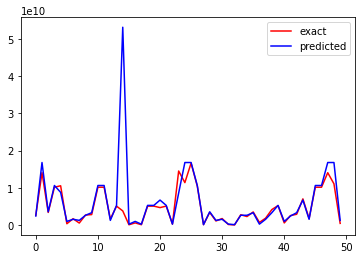

In [31]:
plott(df3, 'Exact', 'Predicted')